In [2]:
import pandas as pd
import re
from sklearn.cross_decomposition import PLSRegression
from sklearn.metrics import mean_absolute_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.linear_model import ElasticNetCV
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

from sklearn.decomposition import PCA

from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression


In [3]:
df0 = pd.read_csv('../data/metrics_masks5_plus_full.csv')
df0 = df0.drop(columns=["image_path", "mask_path","scale_max_used"])

df0["Fungal_Strain"] = df0["plate"].str.split("_").str[1]
df0["Nitrogen_Level"] = df0["plate"].str.split("_").str[2]

views = df0['view'].unique()
mask_types = df0['mask_type'].unique()
dates = df0['date'].unique()[1:]



df_resp_0 = pd.read_excel("../data/MV_final_cleaned_combined.xlsx", sheet_name='wide',engine="openpyxl")
df_resp = df_resp_0.copy()
df_resp["plate"] = df_resp["label"]
df_resp = df_resp[["plate", "respiration"]]

df_combined = pd.merge(df0, df_resp, on='plate')
df_combined = df_combined[df_combined["respiration"] <= 5.0]
print(f"After removing outliers, data size: {df_combined.shape}")
df_combined["fungus"] = df_combined["plate"].str.split("_").str[1]
df_combined["nitrogen"] = df_combined["plate"].str.split("_").str[2]



After removing outliers, data size: (3480, 66)


In [4]:
cols = df_combined.columns
RGB_traits = [c for c in cols if re.match(r"^[RGB]_8bit_", c)]
HSV_traits = [c for c in cols if re.match(r"^[HSV]_", c)]
LAB_traits = [c for c in cols if re.match(r"^(L_|A_|LabB_)", c)]
Ncolor_traits = ['area_pixels', 'circularity',
       'contour_count', 'hull_area', 'max_width', 'min_width', 'perimeter',
       'rect_angle_deg', 'solidity']
trait_order = Ncolor_traits + RGB_traits + HSV_traits + LAB_traits


### PCA+ regression

In [5]:
rows = []

for date in dates:
    for view in views:
        for mask_type in mask_types:
            df_example = df_combined[
                (df_combined["date"] == date) &
                (df_combined["view"] == view) &
                (df_combined["mask_type"] == mask_type)
            ]
            
            if df_example.empty:
                continue

            X = df_example[trait_order]
            y = df_example["respiration"]

            if X.isna().any().any() or y.isna().any():
                continue

            # PCA + 回归
            model = Pipeline([
                ("scaler", StandardScaler()),
                ("pca", PCA(n_components=2)),
                ("lr", LinearRegression())
            ])

            model.fit(X, y)
            y_pred = model.predict(X)
            r2 = r2_score(y, y_pred)

            rows.append({
                "date": date,
                "view": view,
                "mask_type": mask_type,
                "r2": r2,
                "n_samples": len(df_example)
            })

df_pca_r2 = pd.DataFrame(rows)
print(df_pca_r2.head())

         date      view   mask_type        r2  n_samples
0  2024-12-21  overhead         all  0.033749         29
1  2024-12-21  overhead        plug  0.117688         29
2  2024-12-21  overhead    all_plug  0.050672         29
3  2024-12-21  overhead  new_growth  0.050672         29
4  2024-12-21  overhead  old_growth  0.074715         29


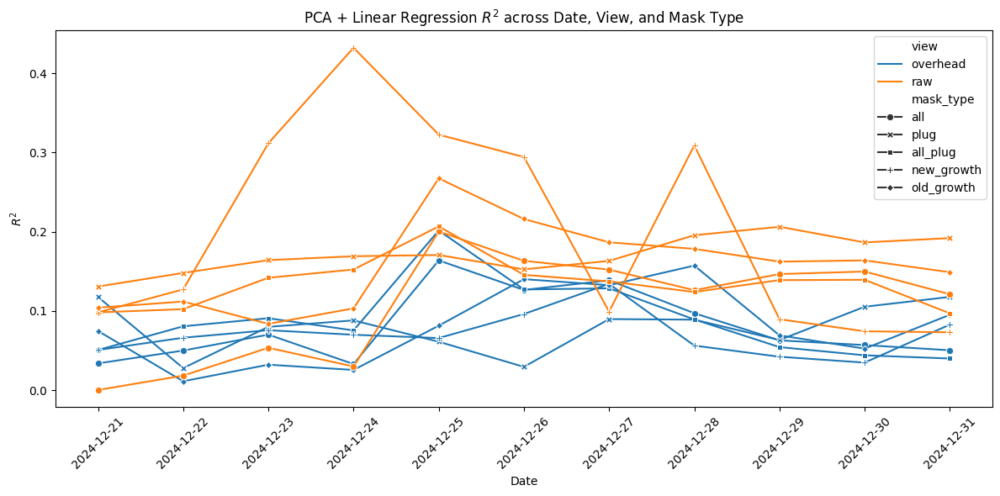

In [6]:
plt.figure(figsize=(12, 6))
sns.lineplot(
    data=df_pca_r2,
    x="date",
    y="r2",
    hue="view",
    style="mask_type",
    markers=True,
    dashes=False
)

plt.title("PCA + Linear Regression $R^2$ across Date, View, and Mask Type")
plt.xlabel("Date")
plt.ylabel("$R^2$")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### PLS 

####  All dataset

In [12]:

rows = []

for date in dates:
    for view in views:
        for mask_type in mask_types:
            df_example = df_combined[
                (df_combined["date"] == date) &
                (df_combined["view"] == view) &
                (df_combined["mask_type"] == mask_type)
            ]
            
            if df_example.empty:
                continue

            X = df_example[trait_order]
            y = df_example["respiration"]

            if X.isna().any().any() or y.isna().any():
                continue
            pls = PLSRegression(n_components=2)
            pls.fit(X, y)
            y_pred = pls.predict(X)
            r2 = r2_score(y, y_pred)

            rows.append({
                "date": date,
                "view": view,
                "mask_type": mask_type,
                "r2": r2,
                "n_samples": len(df_example)
            })

df_pls_r2 = pd.DataFrame(rows)
print(df_pls_r2.head())

         date      view   mask_type        r2  n_samples
0  2024-12-21  overhead         all  0.202390         29
1  2024-12-21  overhead        plug  0.137260         29
2  2024-12-21  overhead    all_plug  0.198877         29
3  2024-12-21  overhead  new_growth  0.198877         29
4  2024-12-21  overhead  old_growth  0.136629         29


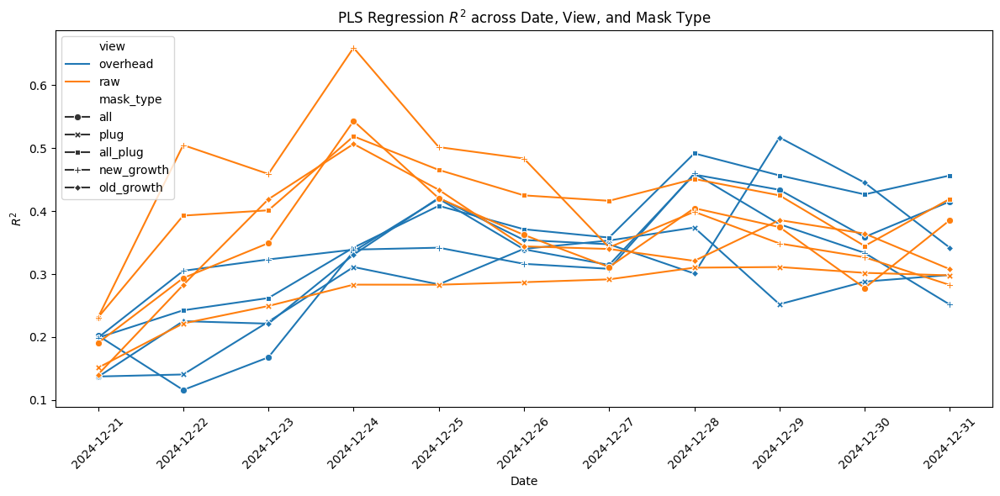

In [13]:
plt.figure(figsize=(12, 6))
sns.lineplot(
    data=df_pls_r2,
    x="date",
    y="r2",
    hue="view",
    style="mask_type",
    markers=True,
    dashes=False
)

plt.title("PLS Regression $R^2$ across Date, View, and Mask Type")
plt.xlabel("Date")
plt.ylabel("$R^2$")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

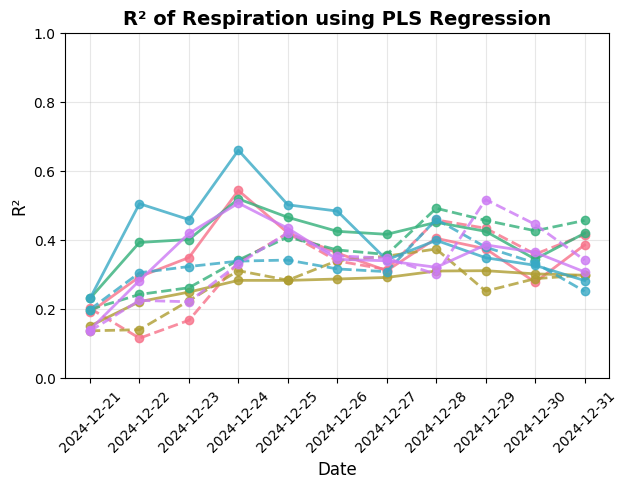

In [14]:

from matplotlib.pyplot import axes


font_dict = 12

#mask_types = sorted(r2_fold2_df["mask_type"].unique())
mask_types = df_pls_r2["mask_type"].unique()

views = df_pls_r2["view"].unique()

# Define color palette for mask types
mask_palette = dict(zip(mask_types, sns.color_palette("husl", len(mask_types))))

# Define line styles for views
view_linestyles = {"raw": "-", "overhead": "--"}


model_data = df_pls_r2.copy()

# Sort by date for proper line plotting
model_data = model_data.sort_values("date")

# Plot each combination of view and mask_type as a line
for mask_type in mask_types:
    mask_data = model_data[model_data["mask_type"] == mask_type]
    
    for view in views:
        view_data = mask_data[mask_data["view"] == view]
        
        if not view_data.empty:
            plt.plot(
                view_data["date"],
                view_data["r2"],
                color=mask_palette[mask_type],
                linestyle=view_linestyles[view],
                marker='o',
                markersize=6,
                linewidth=2,
                alpha=0.8,
                label=f"{mask_type}-{view}"
            )

plt.title("R² of Respiration using PLS Regression", fontsize=font_dict+2, fontweight="bold")
plt.xlabel("Date", fontsize=font_dict)
plt.ylim(0, 1)
plt.xticks(rotation=45)
plt.grid(True, alpha=0.3)

plt.ylabel("R²", fontsize=font_dict)

# Create custom legend
mask_handles = [
plt.Line2D([0], [0], color=mask_palette[m], linestyle='-', marker='o', markersize=6, linewidth=2, label=m)
for m in mask_types
]

view_handles = [
plt.Line2D([0], [0], 
            color='black', 
            linestyle=view_linestyles[v], 
            marker='',        # ← remove marker so linestyle is prominent
            markersize=6, 
            linewidth=2, 
            label=v)
for v in views
]


plt.tight_layout()
plt.subplots_adjust(bottom=0.2)
plt.show()

In [15]:
df_pls_r2["r2"].describe()

count    110.000000
mean       0.341417
std        0.099347
min        0.115839
25%        0.284489
50%        0.340968
75%        0.416154
max        0.659612
Name: r2, dtype: float64

In [16]:
df_pls_r2["r2"].nlargest(2).iloc[-1]

np.float64(0.5432435402201407)

## Elastic Net using all data

In [17]:


rows = []

for date in dates:
    for view in views:
        for mask_type in mask_types:
            df_example = df_combined[
                (df_combined["date"] == date) &
                (df_combined["view"] == view) &
                (df_combined["mask_type"] == mask_type)
            ]
            
            if df_example.empty:
                continue

            X = df_example[trait_order]
            y = df_example["respiration"]

            if X.isna().any().any() or y.isna().any():
                continue

            # 👉 Elastic Net pipeline
            model = Pipeline([
                ("scaler", StandardScaler()),
                ("enet", ElasticNetCV(
                    l1_ratio=[0.1, 0.5, 0.9],
                    cv=5,
                    max_iter=5000
                ))
            ])

            model.fit(X, y)
            y_pred = model.predict(X)
            r2 = r2_score(y, y_pred)

            rows.append({
                "date": date,
                "view": view,
                "mask_type": mask_type,
                "r2": r2,
                "n_samples": len(df_example)
            })

df_enet_r2 = pd.DataFrame(rows)
print(df_enet_r2.head())

/Users/menglinghe/Library/Mobile Documents/com~apple~CloudDocs/UTK/GRA-UTK/fungus-nitrogen/fungus_nitrogen_env/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.836e-03, tolerance: 8.459e-04
  model = cd_fast.enet_coordinate_descent(
/Users/menglinghe/Library/Mobile Documents/com~apple~CloudDocs/UTK/GRA-UTK/fungus-nitrogen/fungus_nitrogen_env/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.928e-03, tolerance: 8.459e-04
  model = cd_fast.enet_coordinate_descent(
/Users/menglinghe/Library/Mobile Documents/com~apple~CloudDocs/UTK/GRA-UTK/fungus-nitrogen/fungus_nitr

         date      view   mask_type   r2  n_samples
0  2024-12-21  overhead         all  0.0         29
1  2024-12-21  overhead        plug  0.0         29
2  2024-12-21  overhead    all_plug  0.0         29
3  2024-12-21  overhead  new_growth  0.0         29
4  2024-12-21  overhead  old_growth  0.0         29


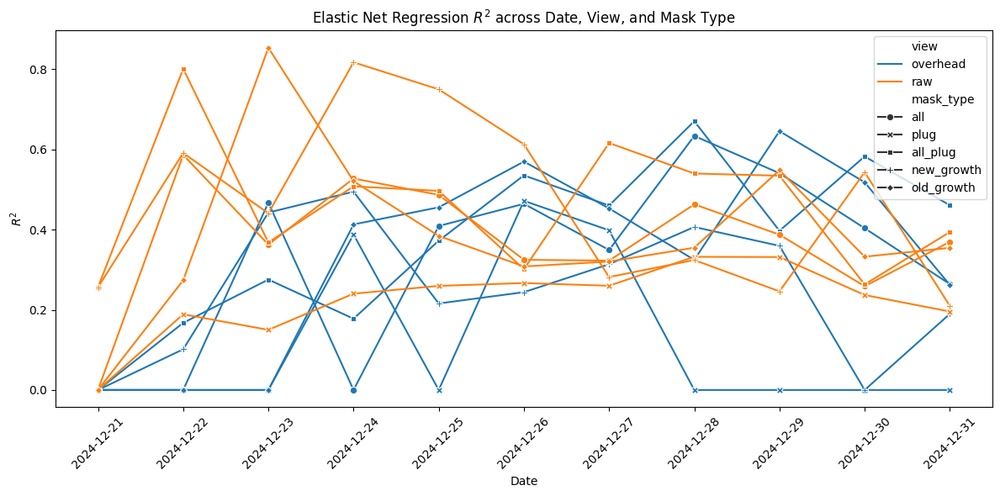

In [18]:
plt.figure(figsize=(12, 6))
sns.lineplot(
    data=df_enet_r2,
    x="date",
    y="r2",
    hue="view",
    style="mask_type",
    markers=True,
    dashes=False
)

plt.title("Elastic Net Regression $R^2$ across Date, View, and Mask Type")
plt.xlabel("Date")
plt.ylabel("$R^2$") 
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [19]:
df_enet_r2

,date,view,mask_type,r2,n_samples
0,2024-12-21,overhead,all,0.000000,29
1,2024-12-21,overhead,plug,0.000000,29
2,2024-12-21,overhead,all_plug,0.000000,29
3,2024-12-21,overhead,new_growth,0.000000,29
4,2024-12-21,overhead,old_growth,0.000000,29
...,...,...,...,...,...
105,2024-12-31,raw,all,0.369377,29
106,2024-12-31,raw,plug,0.195726,29
107,2024-12-31,raw,all_plug,0.394059,29
108,2024-12-31,raw,new_growth,0.209904,29


### Combine

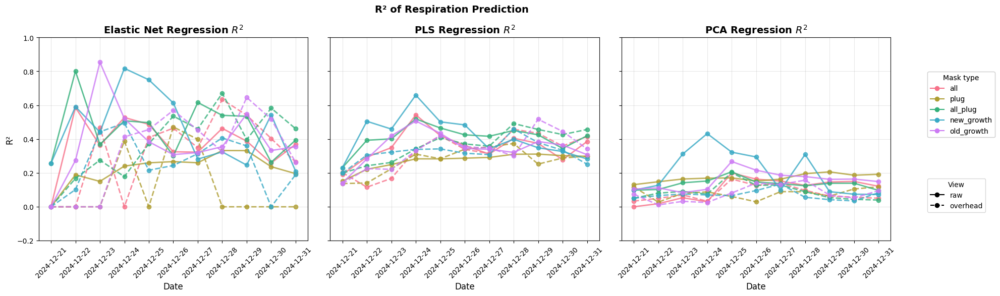

In [25]:
from matplotlib.lines import Line2D

dfs = [
    df_enet_r2, 
    df_pls_r2,
    df_pca_r2
    ]
titles = [
    "Elastic Net Regression $R^2$",
    "PLS Regression $R^2$",
    "PCA Regression $R^2$"
]

fig, axes = plt.subplots(1, len(dfs), figsize=(18, 6), sharey=True)
font_dict = 12

mask_order = ["all", "plug", "all_plug", "new_growth", "old_growth"]
mask_palette = dict(zip(mask_order, sns.color_palette("husl", len(mask_order))))

view_order = ["raw", "overhead"]
view_linestyles = {"raw": "-", "overhead": "--"}

#mask_types = sorted(r2_fold2_df["mask_type"].unique())
mask_types = df_pls_r2["mask_type"].unique()

views = df_pls_r2["view"].unique()

# Define color palette for mask types
# Define line styles for views
view_linestyles = {"raw": "-", "overhead": "--"}

for idx, df in enumerate(dfs):
    ax = axes[idx]
    model_data = df
    
    # Sort by date for proper line plotting
    model_data = model_data.sort_values("date")
    
    # Plot each combination of view and mask_type as a line
    for mask_type in mask_types:
        mask_data = model_data[model_data["mask_type"] == mask_type]
        
        for view in views:
            view_data = mask_data[mask_data["view"] == view]
            
            if not view_data.empty:
                ax.plot(
                    view_data["date"],
                    view_data["r2"],
                    color=mask_palette[mask_type],
                    linestyle=view_linestyles[view],
                    marker='o',
                    markersize=6,
                    linewidth=2,
                    alpha=0.8,
                    label=f"{mask_type}-{view}"
                )
    
    ax.set_title(titles[idx], fontsize=font_dict+2, fontweight="bold")
    ax.set_xlabel("Date", fontsize=font_dict)
    ax.set_ylim(-0.2, 1)
    ax.tick_params(axis='x', rotation=45)
    ax.grid(True, alpha=0.3)

axes[0].set_ylabel("R²", fontsize=font_dict)

# Create custom legend
mask_handles = [
    plt.Line2D([0], [0], color=mask_palette[m], linestyle='-', marker='o', markersize=6, linewidth=2, label=m)
    for m in mask_types
]

view_handles = [
    plt.Line2D([0], [0], 
               color='black', 
               linestyle=view_linestyles[v], 
               marker='',        # ← remove marker so linestyle is prominent
               markersize=6, 
               linewidth=2, 
               label=v)
    for v in views
]
mask_legend = [
    Line2D([0], [0],
           color=mask_palette[m],
           linestyle='-',
           marker='o',
           label=m)
    for m in mask_order
]

view_legend = [
    Line2D([0], [0],
           color='black',
           linestyle=view_linestyles[v],
           marker='o',
           label=v)
    for v in view_order
]

legend1 = fig.legend(
    handles=mask_legend,
    loc="center left",
    bbox_to_anchor=(1.02, 0.65),
    title="Mask type"
)

legend2 = fig.legend(
    handles=view_legend,
    loc="center left",
    bbox_to_anchor=(1.02, 0.35),
    title="View"
)

fig.add_artist(legend1)

fig.suptitle("R² of Respiration Prediction", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.subplots_adjust(bottom=0.2)
plt.savefig("../results/resp_plot/regression_r2_comparison_resp.pdf", format="pdf", dpi=300, bbox_inches="tight")
plt.show()

the not stable result in Elastic Net implies the traits are correlated and also the signinal is diverged.